In [ ]:
#sudo apt-get install libopenslide0
#sudo apt update(for open cv)
#sudo apt install libgl1-mesa-glx((for open cv))


In [7]:
!pip install openslide-python

     |████████████████████████████████| 316 kB 9.0 MB/s eta 0:00:01
  Created wheel for openslide-python: filename=openslide_python-1.1.2-cp37-cp37m-linux_x86_64.whl size=28130 sha256=0d10406434f282dd650038e0aacebffbf9bf39502e3201ea419f2fffdc296729
  Stored in directory: /home/jupyter/.cache/pip/wheels/6f/c3/97/980962653f9305314bfb6d93f80be5e21f13e206af66fc7ad3
Successfully built openslide-python


In [10]:
!pip install tifffile

     |████████████████████████████████| 165 kB 7.5 MB/s eta 0:00:01


In [20]:
import cv2

In [1]:
# Data Science Imports
import pandas as pd
import numpy as np

# Microscopy Related Imports
import openslide
import tifffile

# Cloud Related Imports
from google.cloud import storage

# Visualization Imports
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import seaborn as sns
from PIL import Image
import cv2

# Built In Imports
import os
import gc

# Utility Imports
from vis_utils import mass_visualization
from vis_utils import determine_local_label
from vis_utils import get_all_paths
from vis_utils import find_local_path
from vis_utils import return_path_dirs
from vis_utils import get_overlay_objects
from vis_utils import do_evaluation
from vis_utils import OverlayTool

In [ ]:
#gsutil cp gs://viz_test_bucket/Viz_Input_Test/SGN023_APD_ML1404011E_20200406_avb6_DF4000^1174423.svs .
#gs://viz_test_bucket/Viz_Input_Test/csv/SGN023_APD_ML1404011E_20200406_avb6_DF4000^1174423.csv .

In [4]:
os.getcwd()

'/home/jupyter'

In [3]:
# Create visualization output directory
##PATH_TO_OUTPUT_DIR = "/home/jupyter/viz_tutorial/output_visualizations"

PATH_TO_OUTPUT_DIR = "/home/jupyter"

if not os.path.isdir(PATH_TO_OUTPUT_DIR):
    os.makedirs(os.path.join(PATH_TO_OUTPUT_DIR, "gt", "slide_only"), exist_ok=True)
    os.makedirs(os.path.join(PATH_TO_OUTPUT_DIR, "edge", "slide_only"), exist_ok=True)
    os.makedirs(os.path.join(PATH_TO_OUTPUT_DIR, "gt", "color_maps"))
    os.makedirs(os.path.join(PATH_TO_OUTPUT_DIR, "edge", "color_maps"))

# Path to where prediction CSV's are contained
#PATH_TO_MAIN_CSV_DIR = "/home/jupyter/viz_tutorial/csvs/edge_preds"
#PATH_TO_GT_CSV_DIR = "/home/jupyter/viz_tutorial/csvs/gt_labels"

PATH_TO_MAIN_CSV_DIR = "/home/jupyter/csv/" 
PATH_TO_GT_CSV_DIR = "/home/jupyter/gt/"
#ALL_CSV_PATHS =["/home/jupyter/csv/SGN023_APD_ML1404011E_20200406_avb6_DF4000^1174423.csv" ]
#Get paths to the original slides and the respective CSVs
ALL_CSV_PATHS = [os.path.join(PATH_TO_MAIN_CSV_DIR, f_name) for f_name in os.listdir(PATH_TO_MAIN_CSV_DIR) if not ".ipyn" in f_name]
ALL_GT_CSV_PATHS = [os.path.join(PATH_TO_GT_CSV_DIR, f_name) for f_name in os.listdir(PATH_TO_GT_CSV_DIR) if not ".ipyn" in f_name]
#ALL_PATHS = get_all_paths(list_of_dir_paths=return_path_dirs())
#ALL_PATHS = get_all_paths(list_of_dir_paths=['gs://ihc_dataset/Quantiphi/completed/H&E/AVD-B1VOV-3478A_HE_Scan1.qptiff'
#                                            ,'gs://ihc_dataset/Quantiphi/completed/Focus/Out_Focus/42680.svs'])

ALL_PATHS = ["/home/jupyter/AVD-B1VOV-3478A_HE_Scan1.qptiff","/home/jupyter/42680.svs"]

In [5]:
edge_pred_tool, gt_label_tool = get_overlay_objects(
   slide_name=ALL_GT_CSV_PATHS[0].rsplit("/", 1)[1], 
    #slide_name=ALL_GT_CSV_PATHS[2].rsplit("/", 1)[1], 
   # slide_name=ALL_CSV_PATHS[2].rsplit("/", 1)[1], 
    #slide_name ="SGN023_APD_ML1404011E_20200406_avb6_DF4000^1174423.csv",
    all_csv_paths=ALL_CSV_PATHS, 
    all_slide_paths=ALL_PATHS,
    output_dir=PATH_TO_OUTPUT_DIR, 
    label_dir ='/home/jupyter/gt/',
    return_label_object=True
)

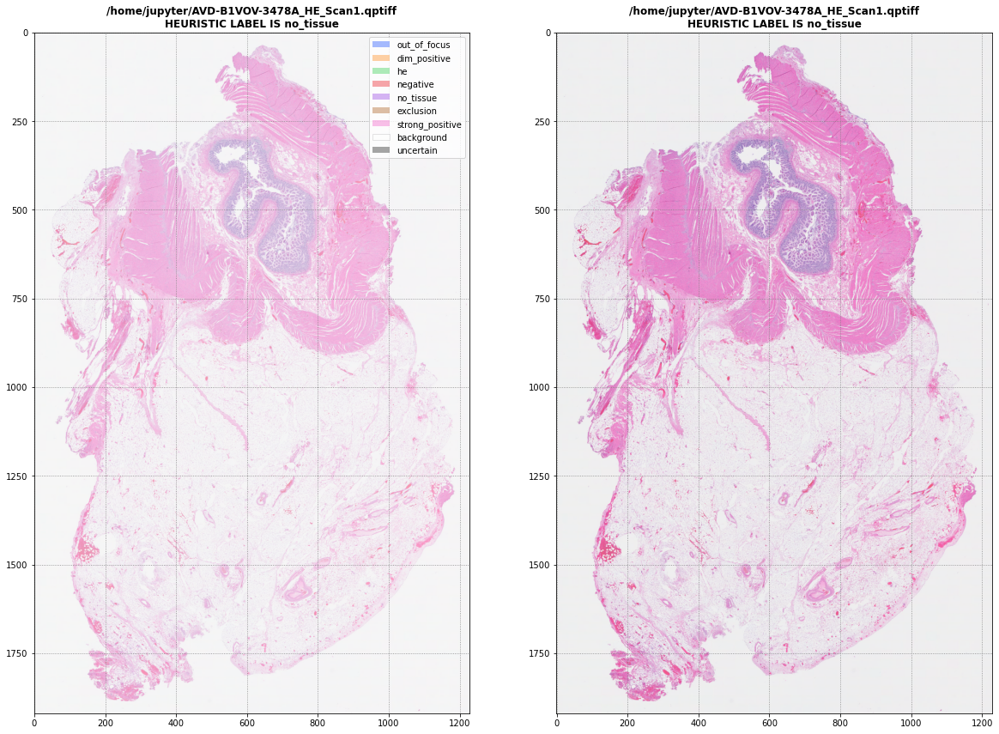

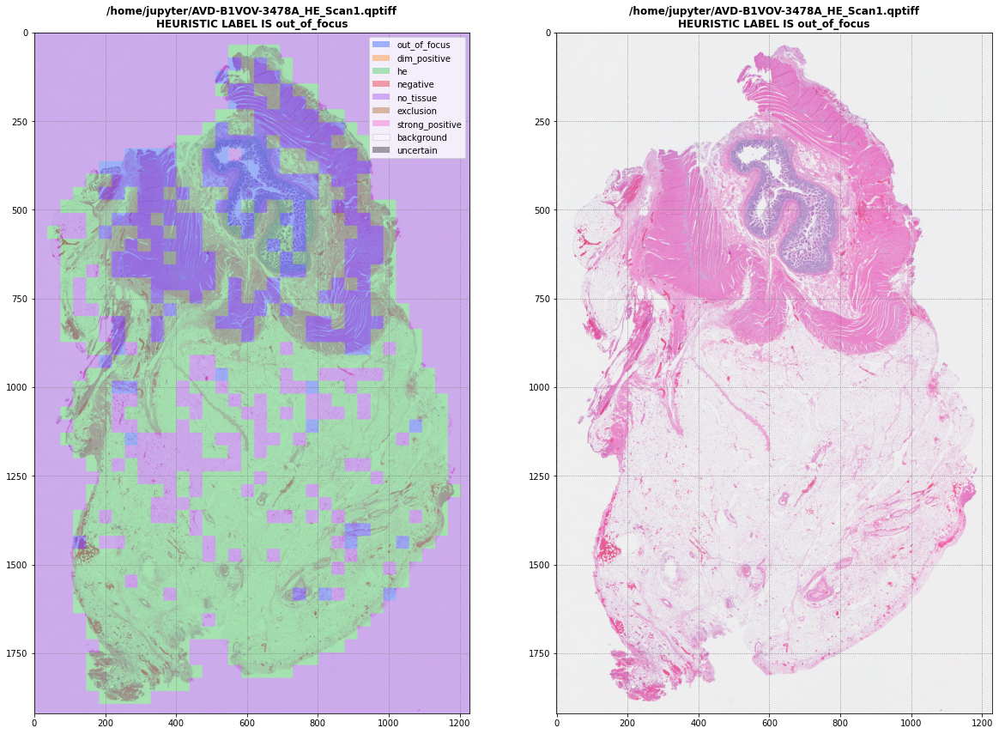

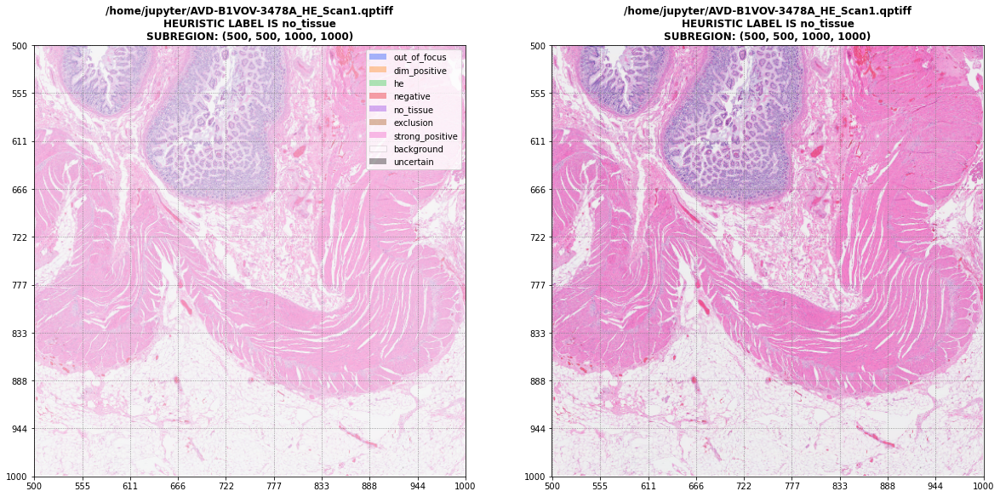

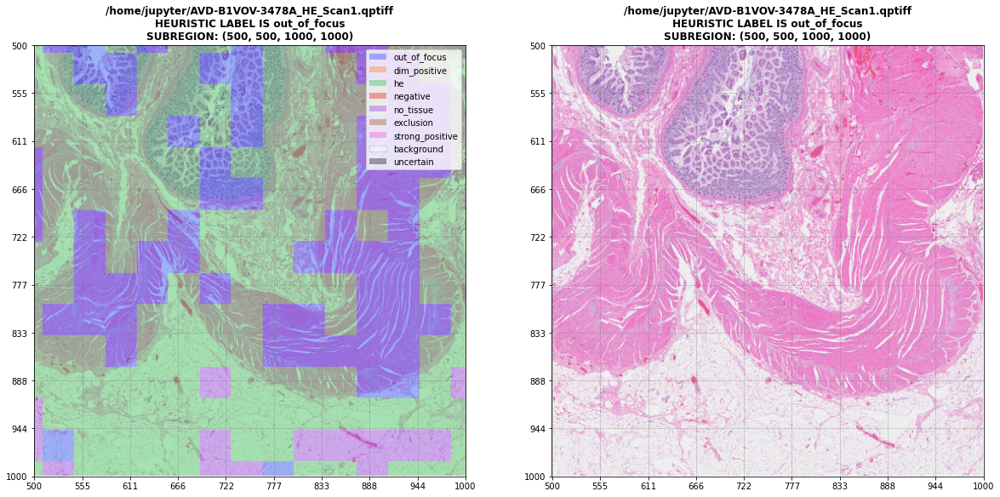

In [6]:
gt_label_tool.plot_side_by_side()
edge_pred_tool.plot_side_by_side()

gt_label_tool.plot_side_by_side(subregion=(500,500,1000,1000))
edge_pred_tool.plot_side_by_side(subregion=(500,500,1000,1000))

<br>

<a style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: navy;" id="evaluate">3&nbsp;&nbsp;EVALUATE</a>

In [7]:
if os.path.isfile("/home/jupyter/viz_tutorial/slide_prediction_df.csv"):
    slide_prediction_df = pd.read_csv("/home/jupyter/viz_tutorial/slide_prediction_df.csv", index_col="Unnamed: 0")
else:   
    slide_prediction_df = do_evaluation(ALL_CSV_PATHS, ALL_PATHS)
display(slide_prediction_df.head())

  0%|          | 0/2 [00:00<?, ?it/s]

,out_of_focus,dim_positive,he,negative,no_tissue,exclusion,strong_positive,heuristic_pred,folder_gt_label,heuristic_binary_pred,folder_binary_gt_label
/home/jupyter/csv/AVD-B1VOV-3478A_HE_Scan1.csv,0.216783,0.0,0.783217,0.0,0.444506,0.0,0.0,out_of_focus,0,BAD,GOOD
/home/jupyter/csv/42680.csv,0.012259,0.0,0.987741,0.0,0.475184,0.0,0.0,he,0,GOOD,GOOD


In [8]:
missed_files = list(slide_prediction_df[slide_prediction_df.heuristic_pred!=slide_prediction_df.folder_gt_label].index.values)

# See which files we missed
print("MISSED FILES:")
for i, f in enumerate(missed_files): print(f"\t{i+1}. {f}")

MISSED FILES:
	1. /home/jupyter/csv/AVD-B1VOV-3478A_HE_Scan1.csv
	2. /home/jupyter/csv/42680.csv


<br>

<a style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: navy;" id="mass_viz">4&nbsp;&nbsp;MASS VISUALIZATION</a>



-----------------------------------------------------------------------------------------------------------------


                                          SLIDE NAME: /home/jupyter/csv/AVD-B1VOV-3478A_HE_Scan1


-----------------------------------------------------------------------------------------------------------------


---------- GROUND TRUTH LABEL DISTRIBUTION ----------

out_of_focus
	%0.00
dim_positive
	%0.00
he
	%0.00
negative
	%0.00
exclusion
	%0.00
strong_positive
	%0.00


---------- PREDICTION DISTRIBUTION ----------

he
	%78.32
out_of_focus
	%21.68
dim_positive
	%0.00
negative
	%0.00
exclusion
	%0.00
strong_positive
	%0.00





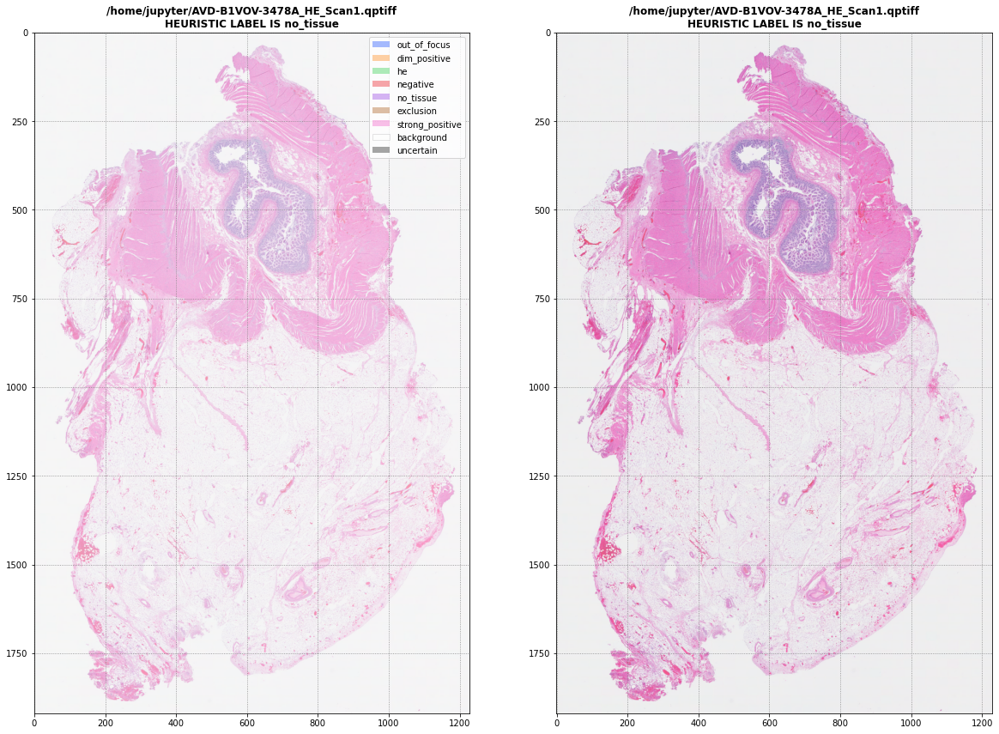

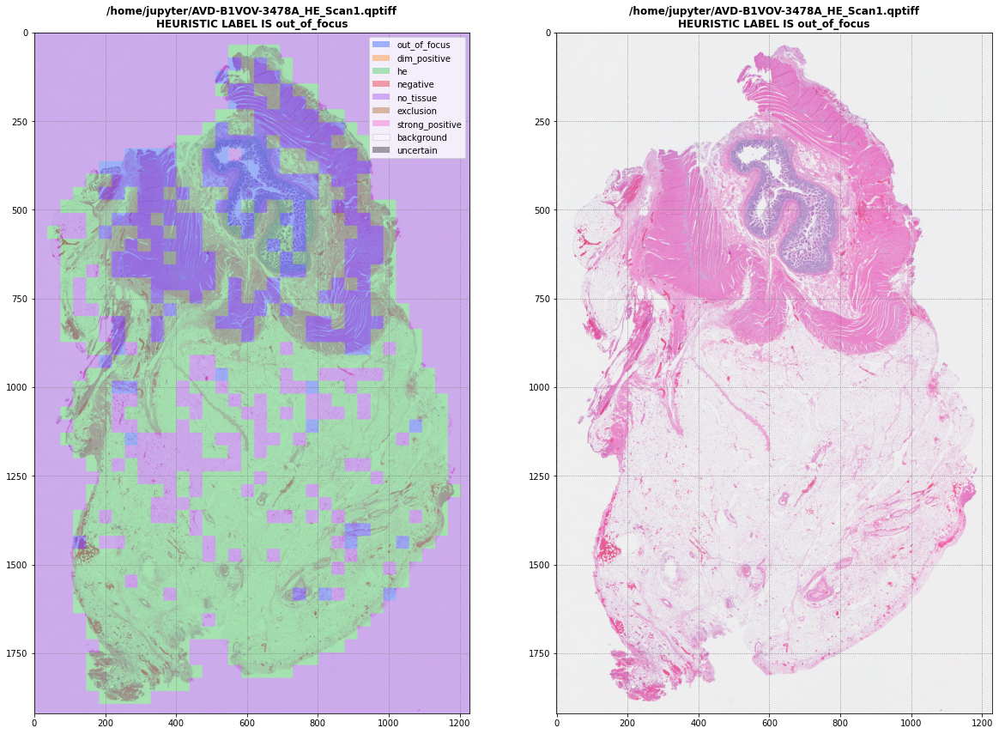



-----------------------------------------------------------------------------------------------------------------




-----------------------------------------------------------------------------------------------------------------


                                          SLIDE NAME: /home/jupyter/csv/42680


-----------------------------------------------------------------------------------------------------------------


---------- GROUND TRUTH LABEL DISTRIBUTION ----------

he
	%82.11
out_of_focus
	%17.89
dim_positive
	%0.00
negative
	%0.00
exclusion
	%0.00
strong_positive
	%0.00


---------- PREDICTION DISTRIBUTION ----------

he
	%98.77
out_of_focus
	%1.23
dim_positive
	%0.00
negative
	%0.00
exclusion
	%0.00
strong_positive
	%0.00





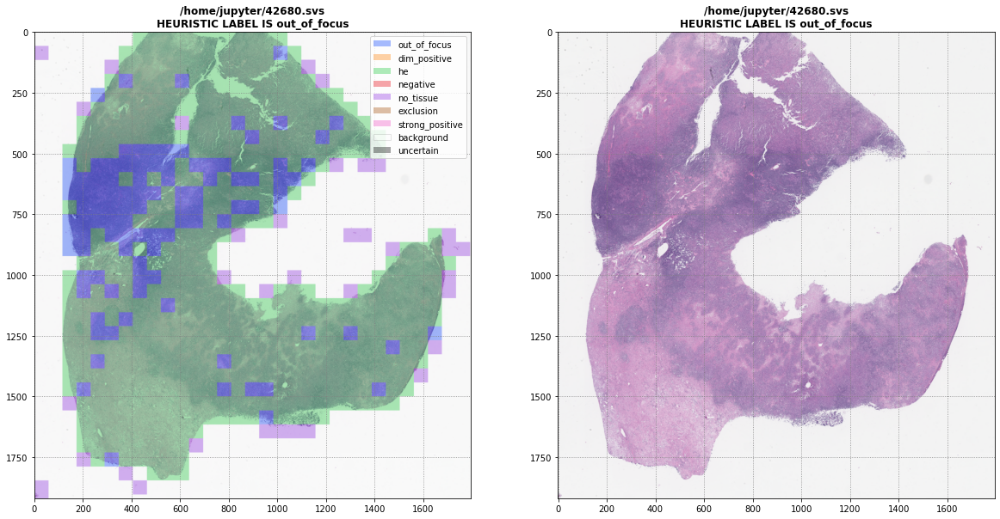

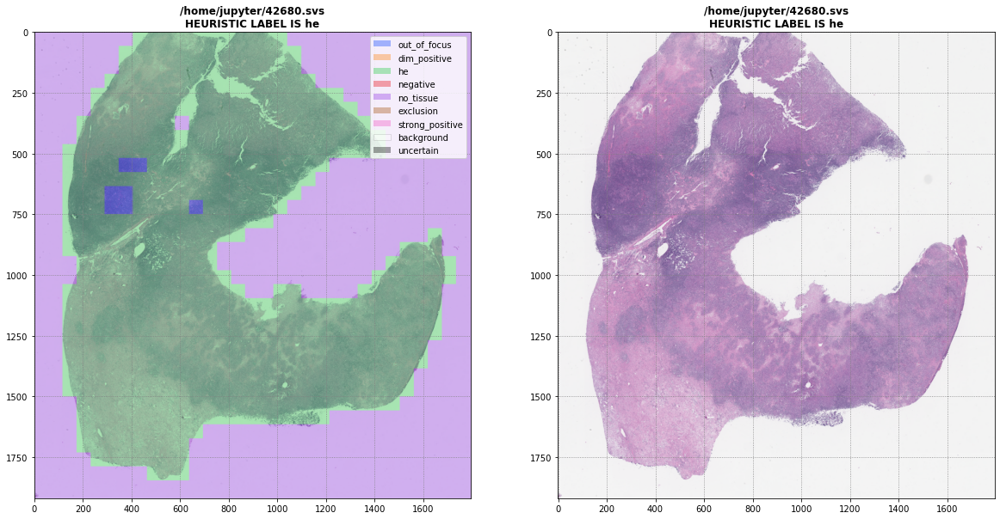



-----------------------------------------------------------------------------------------------------------------




In [9]:
mass_visualization(list_of_names=missed_files, plot_size=1280, all_csv_paths=ALL_CSV_PATHS, all_slide_paths=ALL_PATHS, show_frac_map=True, style="side_by_side")